<a href="https://colab.research.google.com/github/MaDufie/ml_journey/blob/feature%2Feda-with-graph-theory/flight_arrival_delay_prediction_with_graph_theory.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Flight Arrival Delay Prediction**

In [3]:
# connect to drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **Data Preparation**

##  Importing dependencies

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import scatter_matrix
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

## Loading the dataset


In [4]:
df = pd.read_csv('/content/drive/MyDrive/My ML Journey/flight_arrival_delay_prediction/sampled_data.csv')

## Exploring the dataset


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64943 entries, 0 to 64942
Data columns (total 38 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   YEAR                 64943 non-null  int64  
 1   QUARTER              64943 non-null  int64  
 2   MONTH                64943 non-null  int64  
 3   DAY_OF_MONTH         64943 non-null  int64  
 4   DAY_OF_WEEK          64943 non-null  int64  
 5   FL_DATE              64943 non-null  object 
 6   MKT_UNIQUE_CARRIER   64943 non-null  object 
 7   MKT_CARRIER_FL_NUM   64943 non-null  int64  
 8   ORIGIN_AIRPORT_ID    64943 non-null  int64  
 9   ORIGIN               64943 non-null  object 
 10  ORIGIN_CITY_NAME     64943 non-null  object 
 11  ORIGIN_STATE_ABR     64943 non-null  object 
 12  DEST_AIRPORT_ID      64943 non-null  int64  
 13  DEST                 64943 non-null  object 
 14  DEST_CITY_NAME       64943 non-null  object 
 15  DEST_STATE_ABR       64943 non-null 

In [ ]:
df.head()

,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,MKT_UNIQUE_CARRIER,MKT_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN,...,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY
0,2024,2,5,18,6,5/18/2024 12:00:00 AM,NK,75,11298,DFW,...,137.0,158.0,104.0,1.0,731.0,16.0,0.0,21.0,0.0,0.0
1,2024,2,5,31,5,5/31/2024 12:00:00 AM,F9,1669,14492,RDU,...,94.0,125.0,59.0,1.0,356.0,4.0,0.0,31.0,0.0,123.0
2,2024,2,5,18,6,5/18/2024 12:00:00 AM,AA,2689,12892,LAX,...,245.0,249.0,213.0,1.0,1744.0,NaN,NaN,NaN,NaN,NaN
3,2024,2,5,27,1,5/27/2024 12:00:00 AM,B6,1962,14027,PBI,...,170.0,170.0,137.0,1.0,1035.0,0.0,0.0,96.0,0.0,0.0
4,2024,2,5,20,1,5/20/2024 12:00:00 AM,UA,724,11042,CLE,...,204.0,182.0,163.0,1.0,1201.0,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.describe()

,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,MKT_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,DEST_AIRPORT_ID,CRS_DEP_TIME,DEP_TIME,...,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY
count,64943.0,64943.0,64943.0,64943.000000,64943.000000,64943.000000,64943.000000,64943.000000,64943.000000,64047.000000,...,64943.000000,63828.000000,63828.000000,64943.0,64943.000000,16542.000000,16542.000000,16542.000000,16542.000000,16542.000000
mean,2024.0,2.0,5.0,16.106832,3.975117,2681.341453,12649.443974,12649.153873,1331.896478,1339.355005,...,142.427914,138.609482,112.287852,1.0,805.207182,22.386713,6.418329,15.631846,0.089771,34.018377
std,0.0,0.0,0.0,8.933577,1.912074,1766.975948,1525.035206,1524.769235,491.549614,513.755448,...,71.288952,71.978920,69.936447,0.0,589.561776,71.054433,40.001836,34.178422,1.974992,71.036466
min,2024.0,2.0,5.0,1.000000,1.000000,1.000000,10135.000000,10135.000000,1.000000,1.000000,...,25.000000,19.000000,8.000000,1.0,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2024.0,2.0,5.0,8.000000,2.000000,1221.000000,11292.000000,11292.000000,910.000000,911.000000,...,90.000000,86.000000,62.000000,1.0,382.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2024.0,2.0,5.0,16.000000,4.000000,2327.000000,12889.000000,12889.000000,1325.000000,1330.000000,...,125.000000,121.000000,94.000000,1.0,646.000000,1.000000,0.000000,2.000000,0.000000,7.000000
75%,2024.0,2.0,5.0,24.000000,5.000000,4049.000000,14027.000000,14027.000000,1740.000000,1754.000000,...,172.000000,168.000000,141.000000,1.0,1041.000000,18.000000,0.000000,19.000000,0.000000,40.000000
max,2024.0,2.0,5.0,31.000000,7.000000,8802.000000,16869.000000,16869.000000,2359.000000,2400.000000,...,670.000000,680.000000,625.000000,1.0,5095.000000,1676.000000,1728.000000,976.000000,96.000000,2034.000000


In [ ]:
# Checking for missing values
df.isnull().sum()

,0
YEAR,0
QUARTER,0
MONTH,0
DAY_OF_MONTH,0
DAY_OF_WEEK,0
FL_DATE,0
MKT_UNIQUE_CARRIER,0
MKT_CARRIER_FL_NUM,0
ORIGIN_AIRPORT_ID,0
ORIGIN,0


In [ ]:
df.nunique()

,0
YEAR,1
QUARTER,1
MONTH,1
DAY_OF_MONTH,31
DAY_OF_WEEK,7
FL_DATE,31
MKT_UNIQUE_CARRIER,10
MKT_CARRIER_FL_NUM,6197
ORIGIN_AIRPORT_ID,352
ORIGIN,352


In [ ]:
# Checking for duplicate rows
duplicates = df.duplicated()

# Counting the number of duplicate rows
num_duplicates = duplicates.sum()

# Displaying the duplicate rows
duplicate_rows = df[duplicates]

print(f"Number of duplicate rows: {num_duplicates}")
print("Duplicate rows:")
print(duplicate_rows)

Number of duplicate rows: 0
Duplicate rows:
Empty DataFrame
Columns: [YEAR, QUARTER, MONTH, DAY_OF_MONTH, DAY_OF_WEEK, FL_DATE, MKT_UNIQUE_CARRIER, MKT_CARRIER_FL_NUM, ORIGIN_AIRPORT_ID, ORIGIN, ORIGIN_CITY_NAME, ORIGIN_STATE_ABR, DEST_AIRPORT_ID, DEST, DEST_CITY_NAME, DEST_STATE_ABR, CRS_DEP_TIME, DEP_TIME, DEP_DELAY, DEP_DELAY_NEW, DEP_DELAY_GROUP, TAXI_OUT, TAXI_IN, CRS_ARR_TIME, ARR_TIME, ARR_DELAY, ARR_DELAY_NEW, ARR_DELAY_GROUP, CRS_ELAPSED_TIME, ACTUAL_ELAPSED_TIME, AIR_TIME, FLIGHTS, DISTANCE, CARRIER_DELAY, WEATHER_DELAY, NAS_DELAY, SECURITY_DELAY, LATE_AIRCRAFT_DELAY]
Index: []

[0 rows x 38 columns]


In [5]:
# Dropping unneeded columns and remove rows with null values in 'ARR_DELAY_NEW'
data_cleaned = df.drop(columns=['FL_DATE', 'FLIGHTS', 'DEP_DELAY_GROUP', 'ARR_DELAY_GROUP'])
data_cleaned = data_cleaned.dropna(subset=['ARR_DELAY_NEW'])

# Removing rows where 'DAY_OF_WEEK' has a value of 9
data_cleaned = data_cleaned[data_cleaned['DAY_OF_WEEK'] != 9]

# Resetting the index after dropping rows
data_cleaned.reset_index(drop=True, inplace=True)

# Function to convert time from "hhmm" format to total minutes
def convert_to_minutes(time_value):
    if pd.isna(time_value):
        return None
    hours = time_value // 100
    minutes = time_value % 100
    return hours * 60 + minutes

time_columns = ['CRS_DEP_TIME', 'DEP_TIME', 'CRS_ARR_TIME', 'ARR_TIME']
for col in time_columns:
    data_cleaned[col] = data_cleaned[col].apply(convert_to_minutes)

# changing the NaN to 0 for the following columns CARRIER_DELAY, WEATHER_DELAY, NAS_DELAY, SECURITY_DELAY, LATE_AIRCRAFT_DELAY
columns_to_fill = ['CARRIER_DELAY', 'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY']
data_cleaned[columns_to_fill] = data_cleaned[columns_to_fill].fillna(0)

# removing outliers with zscore
from scipy import stats
z_scores = np.abs(stats.zscore(data_cleaned['ARR_DELAY_NEW']))
data_cleaned = data_cleaned[z_scores < 3]

outliers = data_cleaned[z_scores >= 3]
print(f"Number of outliers: {len(outliers)}")


Number of outliers: 0


<ipython-input-5-e86c4b5d7b9d>:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  outliers = data_cleaned[z_scores >= 3]


In [5]:
data_cleaned[time_columns].head()

,CRS_DEP_TIME,DEP_TIME,CRS_ARR_TIME,ARR_TIME
0,915,931.0,1112,1149.0
1,768,895.0,862,1020.0
2,580,580.0,945,949.0
3,836,932.0,1006,1102.0
4,660,655.0,744,717.0


In [6]:
data_cleaned.sample(10)

,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,MKT_UNIQUE_CARRIER,MKT_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN,ORIGIN_CITY_NAME,...,ARR_DELAY_NEW,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,DISTANCE,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY
43182,2024,2,5,6,1,UA,2408,11292,DEN,"Denver, CO",...,49.0,202.0,216.0,197.0,1452.0,35.0,0.0,14.0,0.0,0.0
6055,2024,2,5,20,1,AS,224,10721,BOS,"Boston, MA",...,0.0,395.0,383.0,362.0,2704.0,0.0,0.0,0.0,0.0,0.0
49017,2024,2,5,23,4,UA,1936,11618,EWR,"Newark, NJ",...,74.0,126.0,124.0,96.0,628.0,0.0,54.0,0.0,0.0,20.0
43047,2024,2,5,7,2,F9,1225,14843,SJU,"San Juan, PR",...,0.0,219.0,221.0,193.0,1433.0,0.0,0.0,0.0,0.0,0.0
45255,2024,2,5,29,3,DL,2040,13871,OMA,"Omaha, NE",...,0.0,137.0,120.0,102.0,821.0,0.0,0.0,0.0,0.0,0.0
22612,2024,2,5,19,7,DL,2760,13930,ORD,"Chicago, IL",...,0.0,100.0,92.0,58.0,334.0,0.0,0.0,0.0,0.0,0.0
29270,2024,2,5,31,5,DL,5487,14814,SHV,"Shreveport, LA",...,170.0,106.0,107.0,74.0,551.0,0.0,0.0,1.0,0.0,169.0
59752,2024,2,5,9,4,WN,1106,10821,BWI,"Baltimore, MD",...,0.0,165.0,155.0,135.0,936.0,0.0,0.0,0.0,0.0,0.0
52559,2024,2,5,10,5,UA,2381,11648,FCA,"Kalispell, MT",...,10.0,131.0,141.0,121.0,752.0,0.0,0.0,0.0,0.0,0.0
3237,2024,2,5,1,3,AS,433,15304,TPA,"Tampa, FL",...,0.0,312.0,299.0,280.0,2087.0,0.0,0.0,0.0,0.0,0.0


In [7]:
data_cleaned.isnull().sum()

,0
YEAR,0
QUARTER,0
MONTH,0
DAY_OF_MONTH,0
DAY_OF_WEEK,0
MKT_UNIQUE_CARRIER,0
MKT_CARRIER_FL_NUM,0
ORIGIN_AIRPORT_ID,0
ORIGIN,0
ORIGIN_CITY_NAME,0


array([[<Axes: title={'center': 'YEAR'}>,
        <Axes: title={'center': 'QUARTER'}>,
        <Axes: title={'center': 'MONTH'}>,
        <Axes: title={'center': 'DAY_OF_MONTH'}>,
        <Axes: title={'center': 'DAY_OF_WEEK'}>],
       [<Axes: title={'center': 'MKT_CARRIER_FL_NUM'}>,
        <Axes: title={'center': 'ORIGIN_AIRPORT_ID'}>,
        <Axes: title={'center': 'DEST_AIRPORT_ID'}>,
        <Axes: title={'center': 'CRS_DEP_TIME'}>,
        <Axes: title={'center': 'DEP_TIME'}>],
       [<Axes: title={'center': 'DEP_DELAY'}>,
        <Axes: title={'center': 'DEP_DELAY_NEW'}>,
        <Axes: title={'center': 'TAXI_OUT'}>,
        <Axes: title={'center': 'TAXI_IN'}>,
        <Axes: title={'center': 'CRS_ARR_TIME'}>],
       [<Axes: title={'center': 'ARR_TIME'}>,
        <Axes: title={'center': 'ARR_DELAY'}>,
        <Axes: title={'center': 'ARR_DELAY_NEW'}>,
        <Axes: title={'center': 'CRS_ELAPSED_TIME'}>,
        <Axes: title={'center': 'ACTUAL_ELAPSED_TIME'}>],
       [<Axes

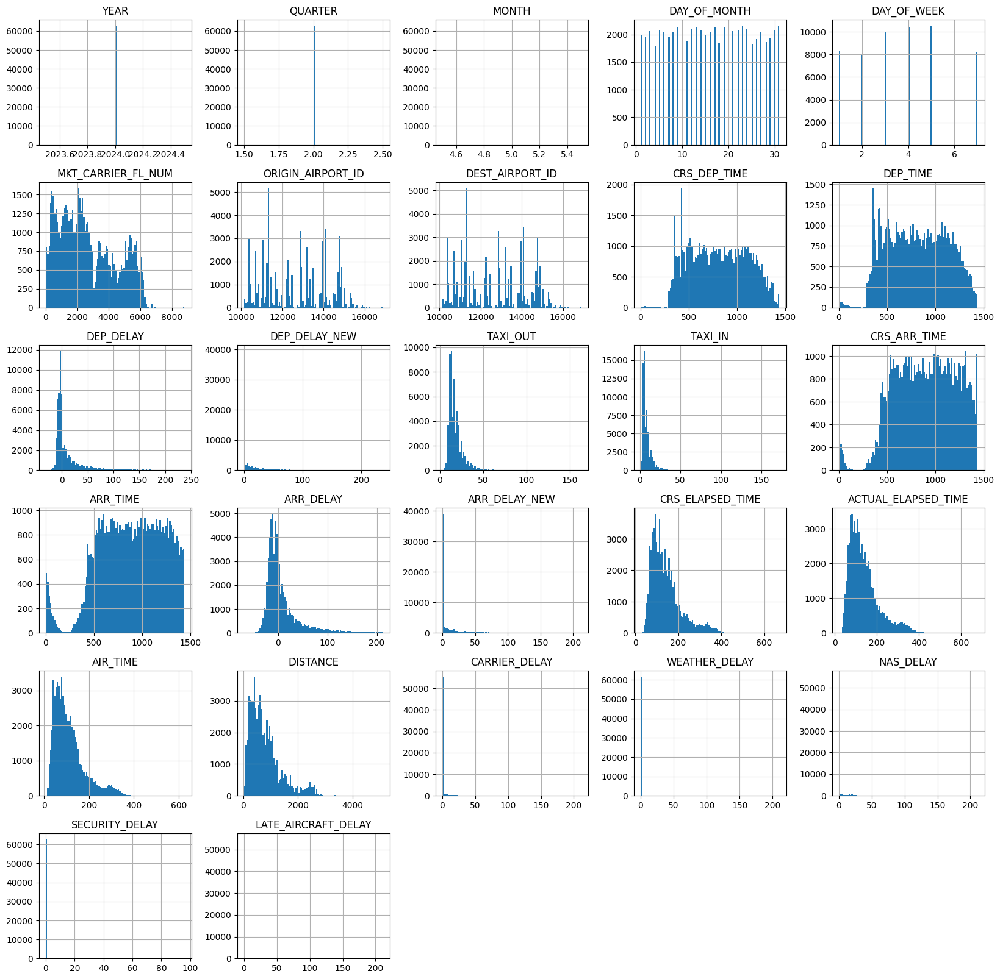

In [ ]:
data_cleaned.hist(bins=100,figsize=(20,20))

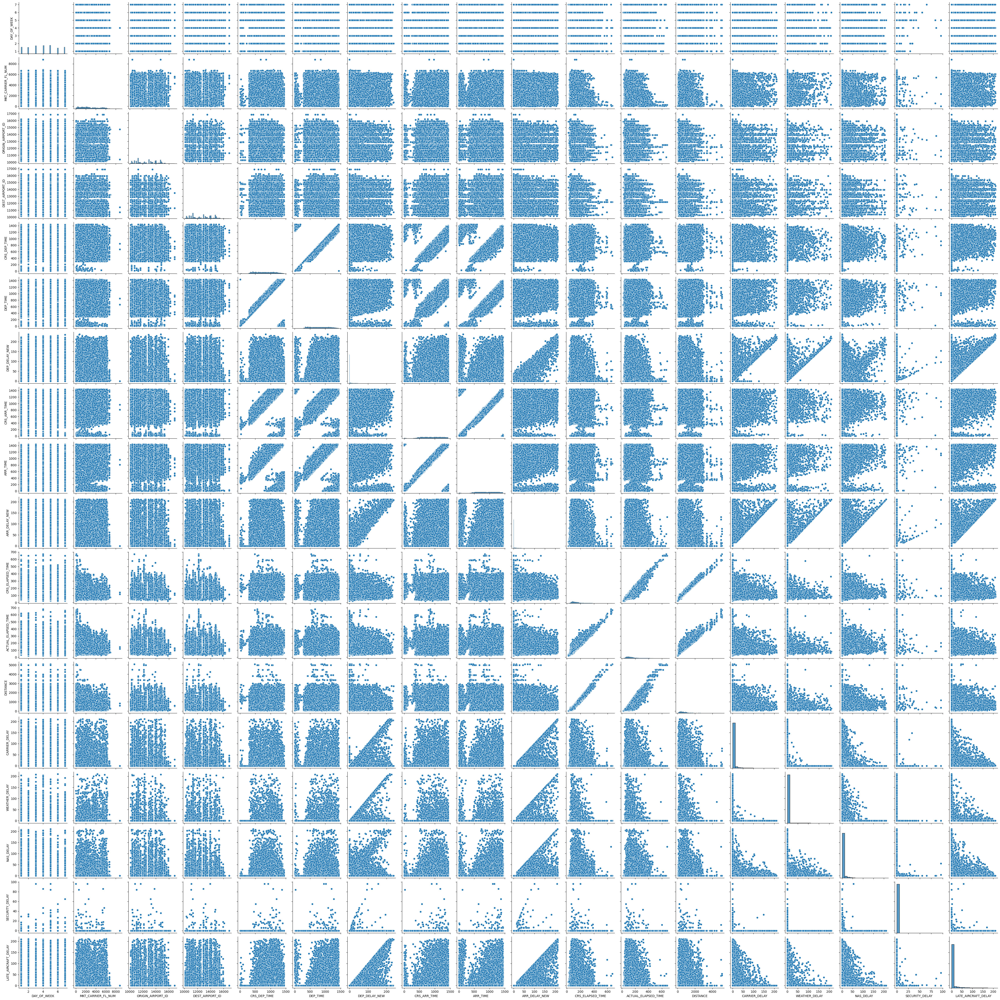

In [ ]:
features = ['DAY_OF_WEEK', 'MKT_CARRIER_FL_NUM', 'ORIGIN_AIRPORT_ID', 'DEST_AIRPORT_ID', 'CRS_DEP_TIME', 'DEP_TIME', 'DEP_DELAY_NEW', 'CRS_ARR_TIME', 'ARR_TIME',
              'ARR_DELAY_NEW', 'CRS_ELAPSED_TIME', 'ACTUAL_ELAPSED_TIME','DISTANCE', 'CARRIER_DELAY', 'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY' ]
sns.pairplot(data_cleaned[features])

## Feature Engineering

### Time of Day
*   Creating a new feature to determine if the flight was in the morning or evening


In [6]:
def get_time_of_day(hour):
    if hour is None:
        return None
    if 300 <= hour < 720:  # 5AM to 12PM
        return 'Morning'
    elif 720 <= hour < 1080:  # 12PM to 6PM
        return 'Afternoon'
    elif 1080 <= hour < 1320: # 6PM to 10PM
        return 'Evening'
    else:
        return 'Night'

data_cleaned['CRS_DEP_TIME_OF_DAY'] = data_cleaned['CRS_DEP_TIME'].apply(get_time_of_day)
data_cleaned['CRS_ARR_TIME_OF_DAY'] = data_cleaned['CRS_ARR_TIME'].apply(get_time_of_day)

In [9]:
data_cleaned.head()

,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,MKT_UNIQUE_CARRIER,MKT_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN,ORIGIN_CITY_NAME,...,ACTUAL_ELAPSED_TIME,AIR_TIME,DISTANCE,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,CRS_DEP_TIME_OF_DAY,CRS_ARR_TIME_OF_DAY
0,2024,2,5,18,6,NK,75,11298,DFW,"Dallas/Fort Worth, TX",...,158.0,104.0,731.0,16.0,0.0,21.0,0.0,0.0,Afternoon,Evening
1,2024,2,5,31,5,F9,1669,14492,RDU,"Raleigh/Durham, NC",...,125.0,59.0,356.0,4.0,0.0,31.0,0.0,123.0,Afternoon,Afternoon
2,2024,2,5,18,6,AA,2689,12892,LAX,"Los Angeles, CA",...,249.0,213.0,1744.0,0.0,0.0,0.0,0.0,0.0,Morning,Afternoon
3,2024,2,5,27,1,B6,1962,14027,PBI,"West Palm Beach/Palm Beach, FL",...,170.0,137.0,1035.0,0.0,0.0,96.0,0.0,0.0,Afternoon,Afternoon
4,2024,2,5,20,1,UA,724,11042,CLE,"Cleveland, OH",...,182.0,163.0,1201.0,0.0,0.0,0.0,0.0,0.0,Morning,Afternoon


### Arrival Delay Class
*   Create a new column ARR_DELAY_CLASS where the value is 1 if ARR_DELAY_NEW is 15 minutes or more, and 0 if it's less than 15 minutes.

In [7]:
# Using Delayed if ARR_DELAY_NEW is 15 minutes or more
data_cleaned['ARR_DELAY_CLASS'] = data_cleaned['ARR_DELAY_NEW'].apply(lambda x: 1 if x >= 15 else 0)
data_cleaned['ARR_DELAY_CLASS'].value_counts(normalize=True)

,proportion
ARR_DELAY_CLASS,
0,0.752794
1,0.247206


# **Exploratory Data Analysis**

### Arrival Delay Distribution

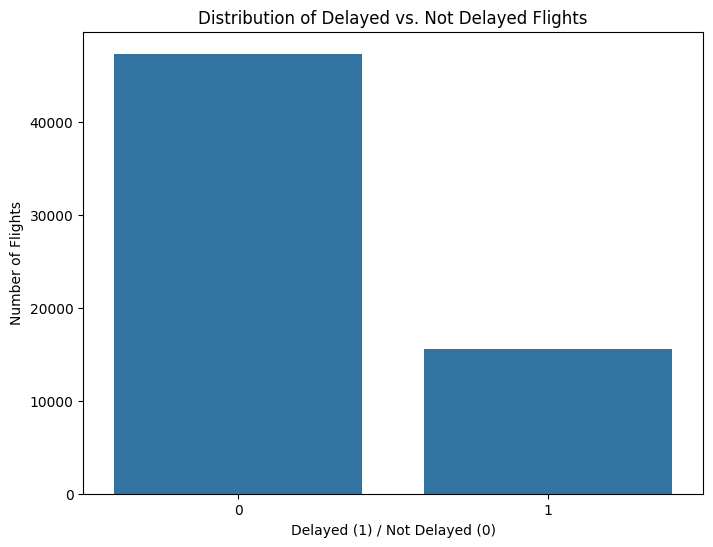

In [11]:
plt.figure(figsize=(8,6))
sns.countplot(x='ARR_DELAY_CLASS', data=data_cleaned)
plt.title('Distribution of Delayed vs. Not Delayed Flights')
plt.xlabel('Delayed (1) / Not Delayed (0)')
plt.ylabel('Number of Flights')
plt.show()


## Departure Delay vs Arrival Delay

<Axes: xlabel='DEP_DELAY_NEW', ylabel='ARR_DELAY_NEW'>

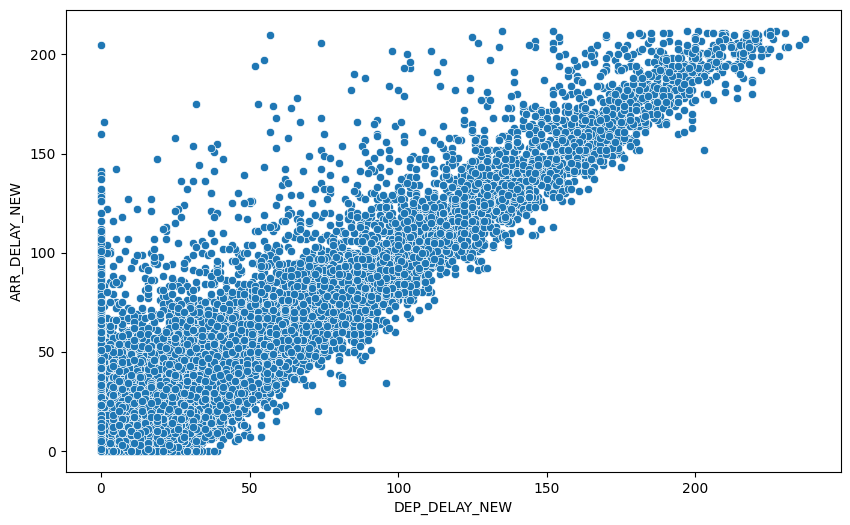

In [12]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='DEP_DELAY_NEW', y='ARR_DELAY_NEW', data=data_cleaned)

## Day of the Week vs Arrival Delay



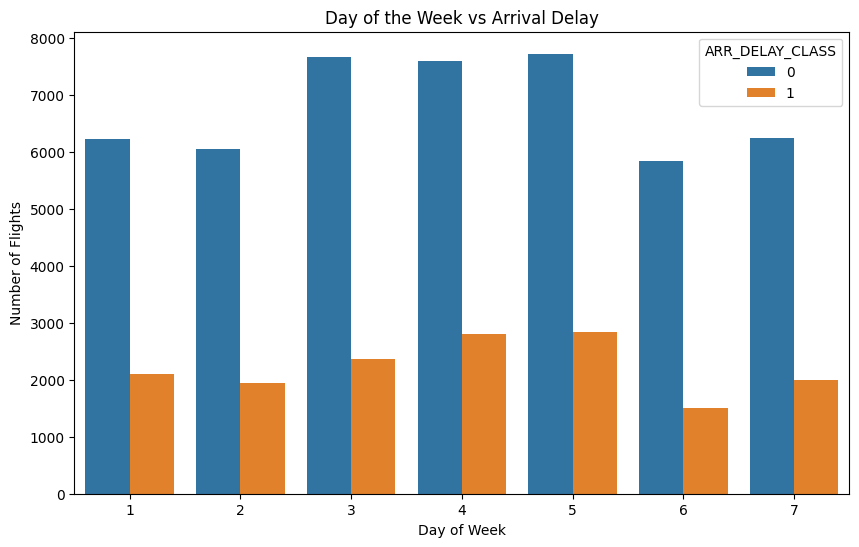

In [13]:
plt.figure(figsize=(10,6))
sns.countplot(data=data_cleaned, x='DAY_OF_WEEK', hue='ARR_DELAY_CLASS')

plt.title('Day of the Week vs Arrival Delay')
plt.xlabel('Day of Week')
plt.ylabel('Number of Flights')
plt.show()

## Scheduled Arrival Time of Day vs Arrival Delay

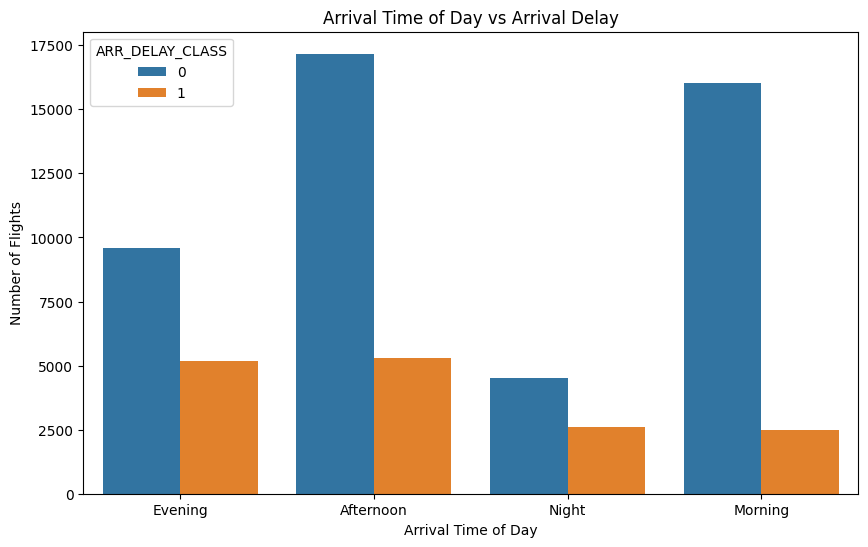

In [14]:
plt.figure(figsize=(10,6))
sns.countplot(data=data_cleaned, x='CRS_ARR_TIME_OF_DAY', hue='ARR_DELAY_CLASS')

plt.title('Arrival Time of Day vs Arrival Delay')
plt.xlabel('Arrival Time of Day')
plt.ylabel('Number of Flights')
plt.show()


## Scheduled Departure Time of Day vs Arrival Delay

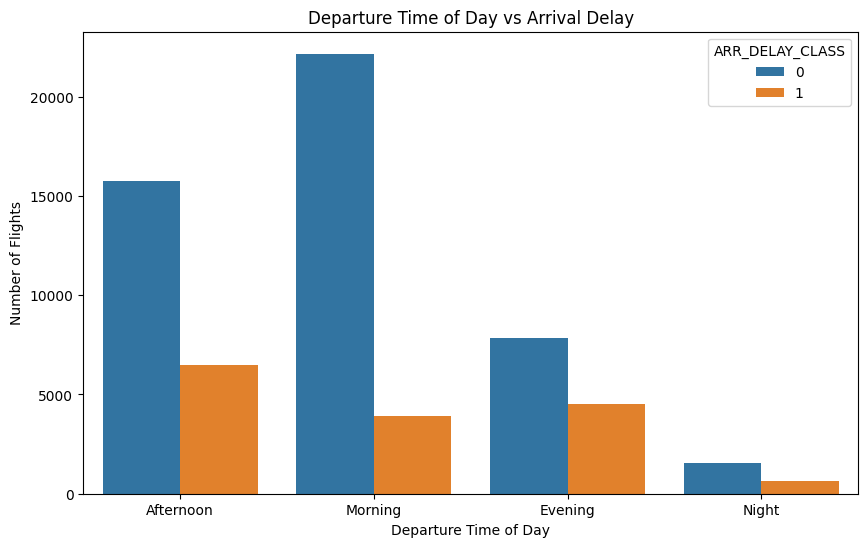

In [15]:
plt.figure(figsize=(10,6))
sns.countplot(data=data_cleaned, x='CRS_DEP_TIME_OF_DAY', hue='ARR_DELAY_CLASS')

plt.title('Departure Time of Day vs Arrival Delay')
plt.xlabel('Departure Time of Day')
plt.ylabel('Number of Flights')
plt.show()


## Time of day most flights arrive

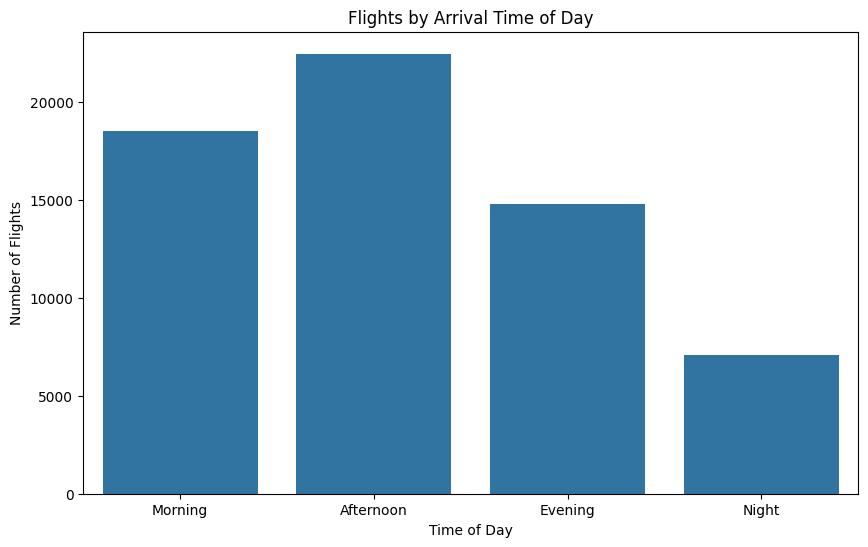

In [16]:
plt.figure(figsize=(10,6))
sns.countplot(data=data_cleaned, x='CRS_ARR_TIME_OF_DAY', order=['Morning', 'Afternoon', 'Evening', 'Night'])
plt.title('Flights by Arrival Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Number of Flights')
plt.show()

## Carrier Performance

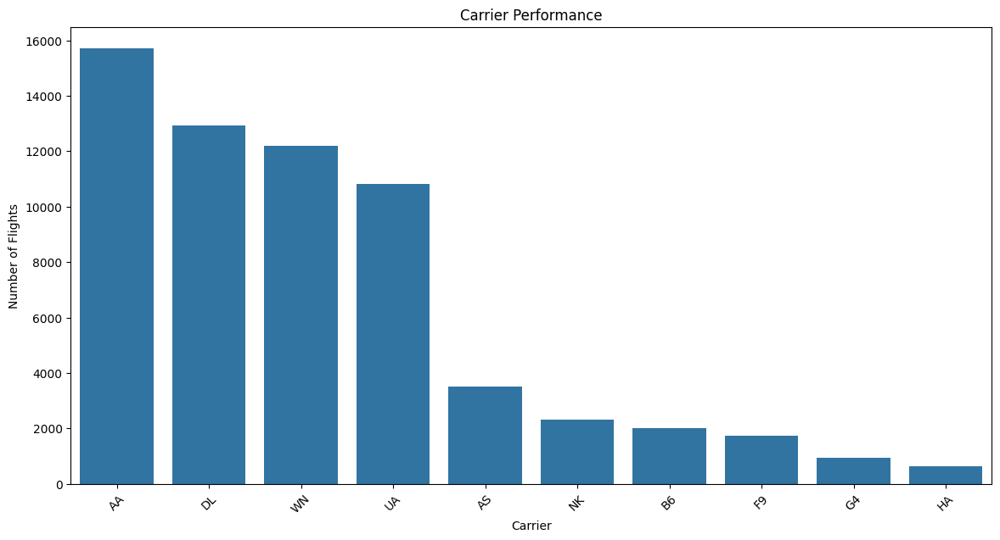

In [18]:
plt.figure(figsize=(14,7))
sns.countplot(data=data_cleaned, x='MKT_UNIQUE_CARRIER', order=df['MKT_UNIQUE_CARRIER'].value_counts().index)

plt.title('Carrier Performance')
plt.xlabel('Carrier')
plt.ylabel('Number of Flights')
plt.xticks(rotation=45)
plt.show()

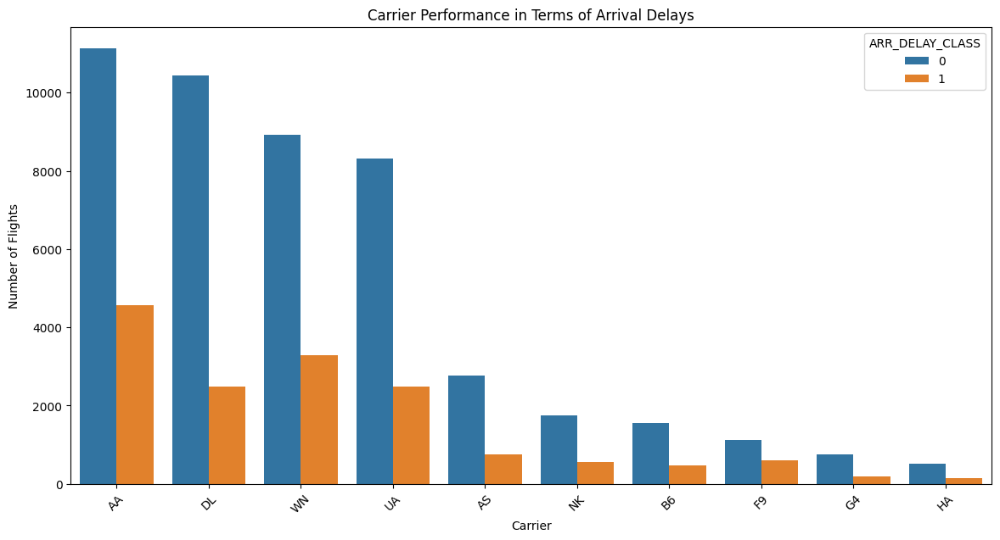

In [20]:
plt.figure(figsize=(14,7))
sns.countplot(data=data_cleaned, x='MKT_UNIQUE_CARRIER', hue='ARR_DELAY_CLASS', order=df['MKT_UNIQUE_CARRIER'].value_counts().index)

plt.title('Carrier Performance in Terms of Arrival Delays')
plt.xlabel('Carrier')
plt.ylabel('Number of Flights')
plt.xticks(rotation=45)
plt.show()

## Flight Distance

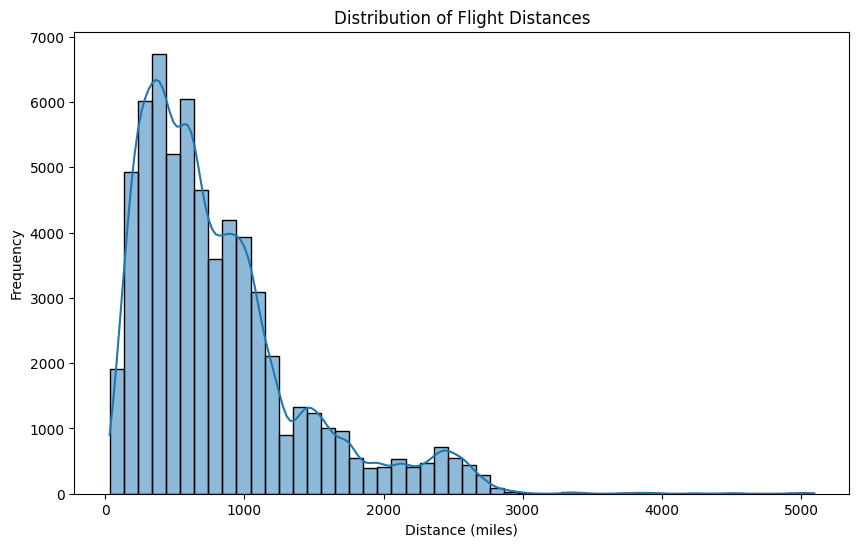

In [8]:
plt.figure(figsize=(10,6))
sns.histplot(data_cleaned['DISTANCE'], bins=50, kde=True)
plt.title('Distribution of Flight Distances')
plt.xlabel('Distance (miles)')
plt.ylabel('Frequency')
plt.show()


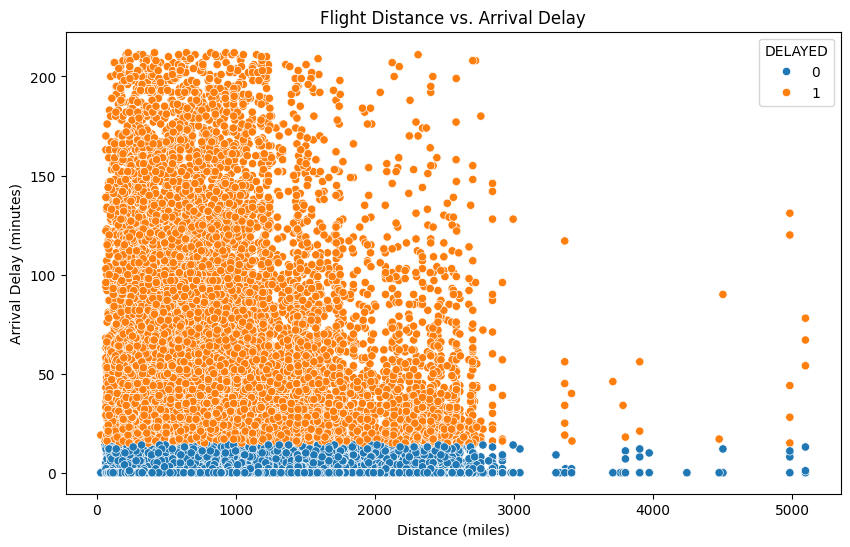

In [ ]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='DISTANCE', y='ARR_DELAY_NEW', hue='DELAYED', data=data_cleaned)
plt.title('Flight Distance vs. Arrival Delay')
plt.xlabel('Distance (miles)')
plt.ylabel('Arrival Delay (minutes)')
plt.show()

##  Correlation between Scheduled Elapsed Time and Distance

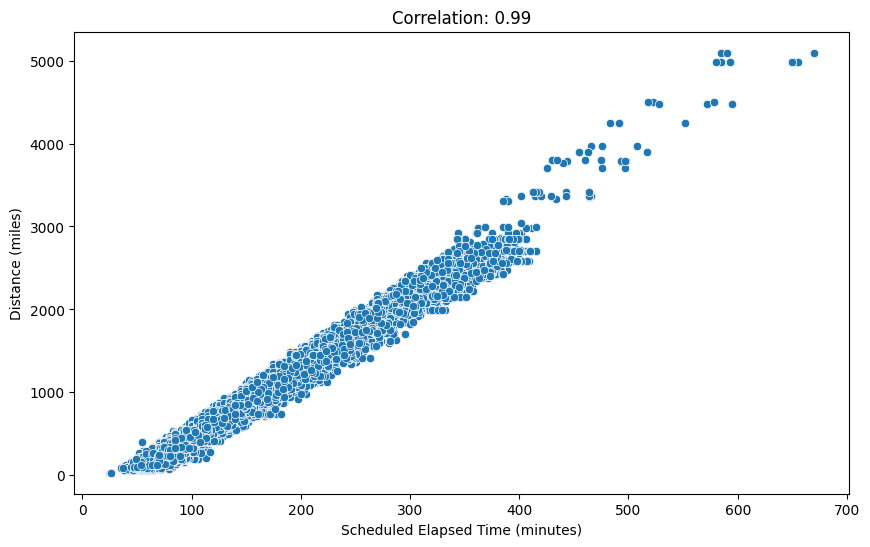

Correlation between CRS_ELAPSED_TIME and DISTANCE: 0.9874339585021089


In [15]:
correlation = data_cleaned['CRS_ELAPSED_TIME'].corr(data_cleaned['DISTANCE'])

# plot correlation
plt.figure(figsize=(10,6))
sns.scatterplot(x='CRS_ELAPSED_TIME', y='DISTANCE', data=data_cleaned)
plt.title(f'Correlation: {correlation:.2f}')
plt.xlabel('Scheduled Elapsed Time (minutes)')
plt.ylabel('Distance (miles)')
plt.show()

print(f"Correlation between CRS_ELAPSED_TIME and DISTANCE: {correlation}")

## Number of Flights for each Delay Cause

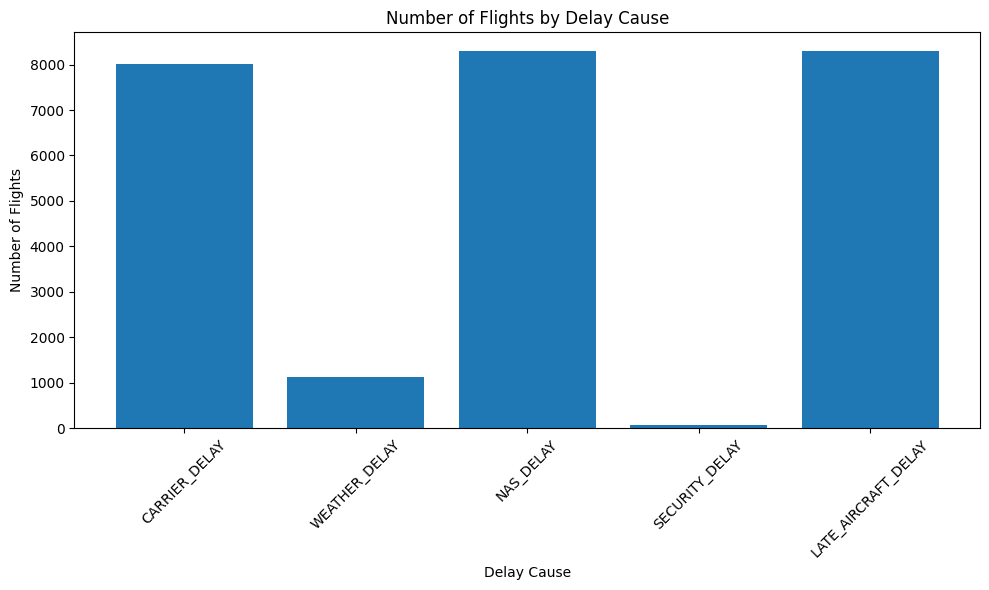

In [33]:
# Creating a dictionary to store the number of flights with each type of delay
delay_causes = ['CARRIER_DELAY', 'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY']
delay_counts = {cause: (data_cleaned[cause] > 0).sum() for cause in delay_causes}

plt.figure(figsize=(10, 6))
plt.bar(delay_counts.keys(), delay_counts.values())
plt.title('Number of Flights by Delay Cause')
plt.xlabel('Delay Cause')
plt.ylabel('Number of Flights')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Average Delay for Each Cause of Delay

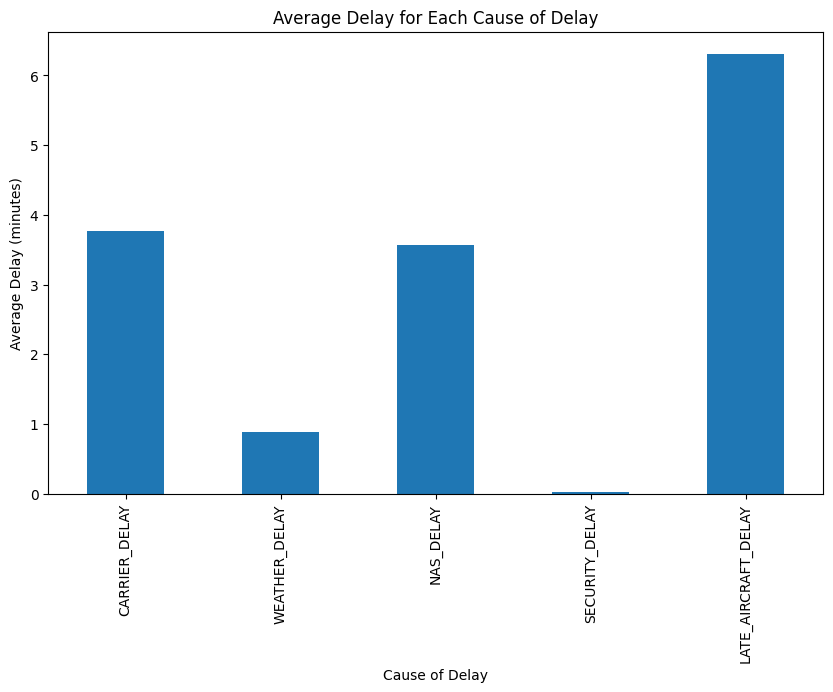

In [31]:
delay_causes = ['CARRIER_DELAY', 'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY']
average_delays = data_cleaned[delay_causes].mean()

plt.figure(figsize=(10,6))
average_delays.plot(kind='bar')
plt.title('Average Delay for Each Cause of Delay')
plt.xlabel('Cause of Delay')
plt.ylabel('Average Delay (minutes)')
plt.show()

## Correlation Matrix

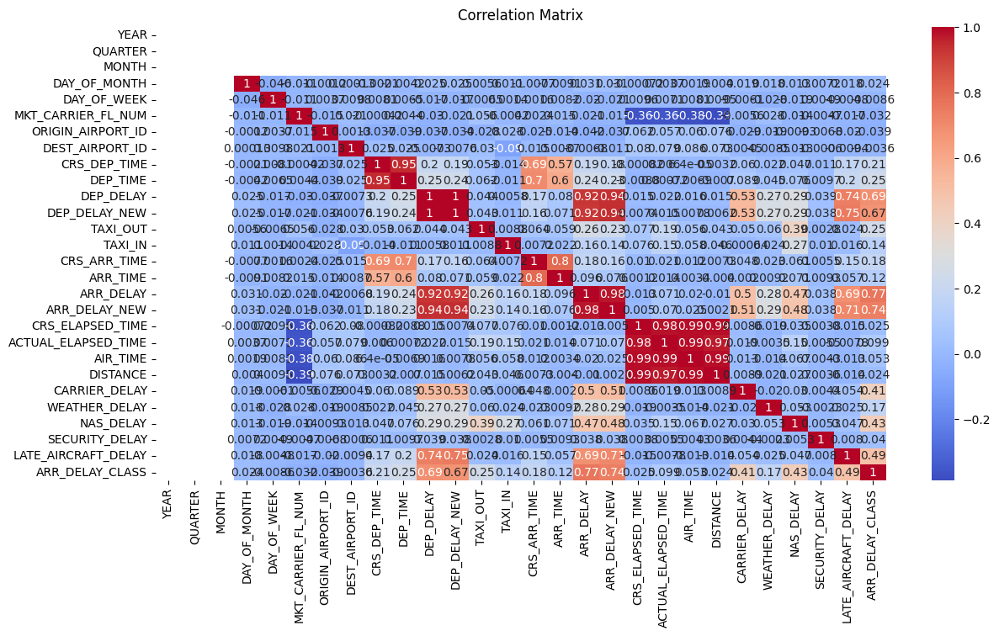

In [34]:
plt.figure(figsize=(14,7))
numerical_df = data_cleaned.select_dtypes(include=['number'])
correlation_matrix = numerical_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


#  **Predictive Modeling**

##Data Preprocessing

In [ ]:
data = data_cleaned[['DAY_OF_MONTH', 'DAY_OF_WEEK', 'MKT_UNIQUE_CARRIER', 'MKT_CARRIER_FL_NUM', 'ORIGIN_AIRPORT_ID', 'DEST_AIRPORT_ID', 'CRS_DEP_TIME', 'CRS_ARR_TIME', 'ARR_DELAY_NEW']]
data.sample(10)

,DAY_OF_MONTH,DAY_OF_WEEK,MKT_UNIQUE_CARRIER,MKT_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,DEST_AIRPORT_ID,CRS_DEP_TIME,CRS_ARR_TIME,ARR_DELAY_NEW
342,26,7,UA,1057,13487,11292,8,10,0.0
28113,15,3,DL,4324,11525,14869,6,8,0.0
9110,13,1,WN,147,14107,10140,6,8,0.0
41476,23,4,DL,1615,11884,13487,6,11,0.0
50863,15,3,AA,2229,11423,11298,17,19,31.0
56931,31,5,G4,846,14082,14259,7,10,2.0
47565,6,1,UA,4870,12206,12266,17,18,0.0
61228,6,1,DL,461,11298,12953,6,10,5.0
7518,22,3,AA,418,10721,11057,5,7,0.0
22522,3,5,WN,2787,12889,10800,20,21,0.0


                    DAY_OF_MONTH  DAY_OF_WEEK  MKT_CARRIER_FL_NUM  \
DAY_OF_MONTH            1.000000    -0.046284           -0.010777   
DAY_OF_WEEK            -0.046284     1.000000           -0.011332   
MKT_CARRIER_FL_NUM     -0.010777    -0.011332            1.000000   
ORIGIN_AIRPORT_ID      -0.001229     0.003724           -0.015040   
DEST_AIRPORT_ID         0.000132     0.009808            0.021451   
CRS_DEP_TIME           -0.002434     0.008034           -0.001083   
CRS_ARR_TIME           -0.007836     0.001804            0.003260   
ARR_DELAY_NEW           0.031062    -0.020974           -0.014944   

                    ORIGIN_AIRPORT_ID  DEST_AIRPORT_ID  CRS_DEP_TIME  \
DAY_OF_MONTH                -0.001229         0.000132     -0.002434   
DAY_OF_WEEK                  0.003724         0.009808      0.008034   
MKT_CARRIER_FL_NUM          -0.015040         0.021451     -0.001083   
ORIGIN_AIRPORT_ID            1.000000         0.001345     -0.037982   
DEST_AIRPORT_ID   

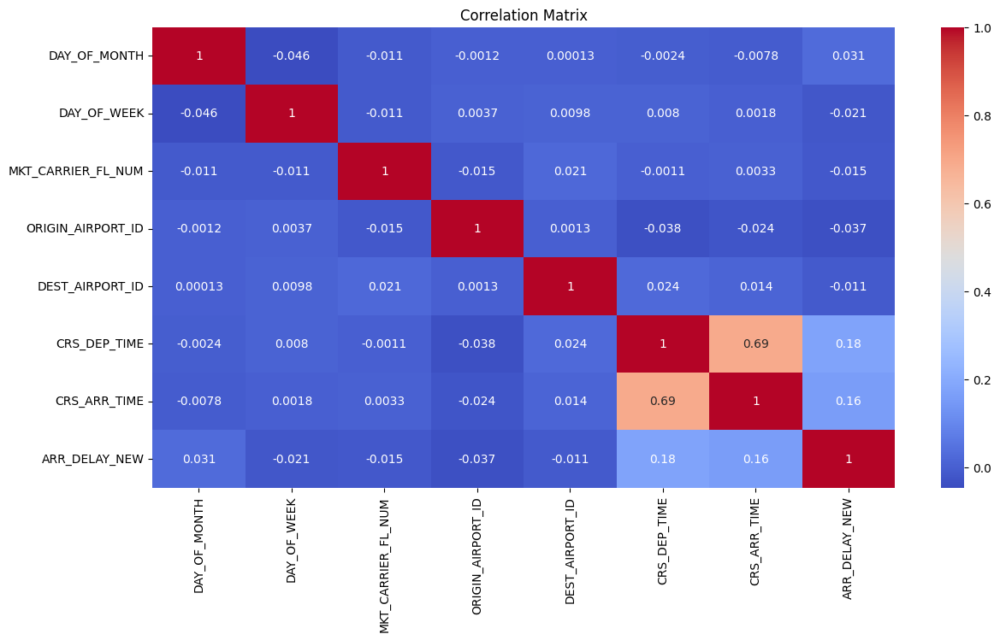

In [ ]:
plt.figure(figsize=(14,7))
numerical_df = data.select_dtypes(include=['number'])
correlation_matrix = numerical_df.corr()
print(correlation_matrix)
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


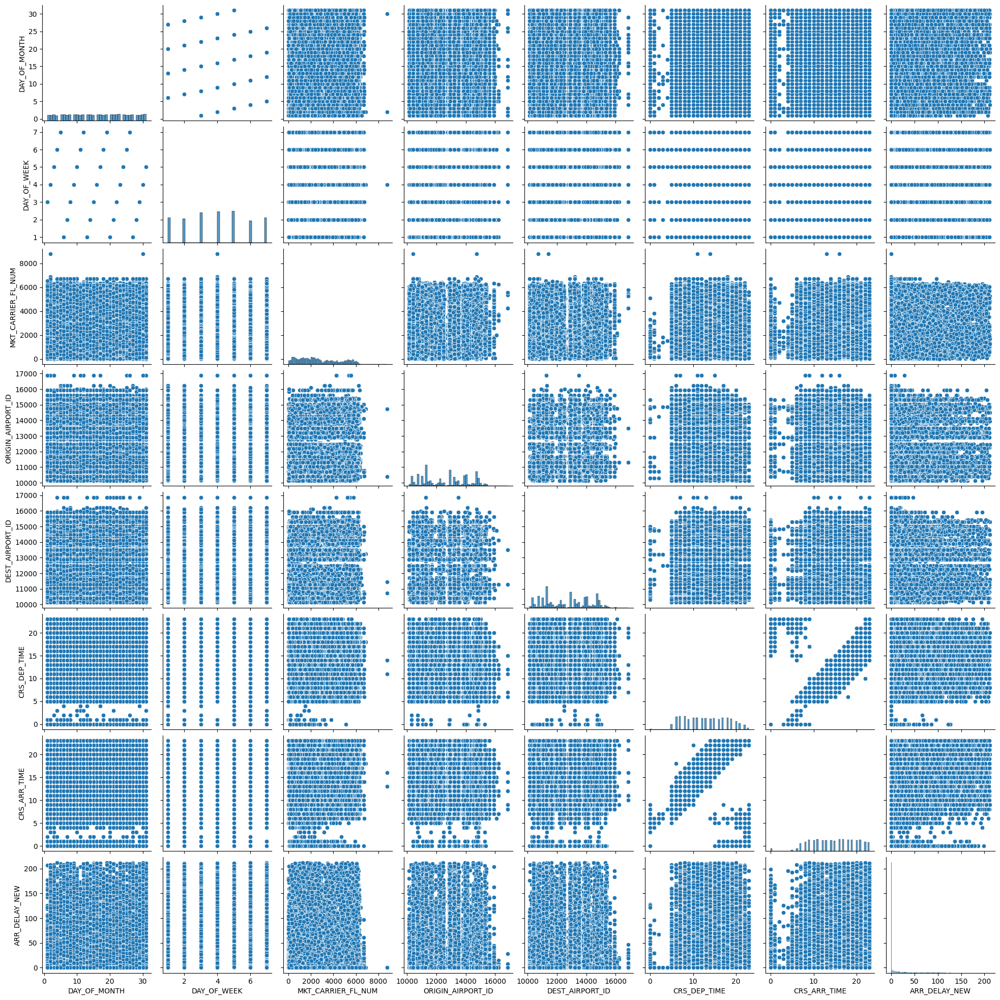

In [ ]:
sns.pairplot(data)

### Encoding Categorical Data

In [ ]:
# Applying One-Hot Encoding to the "MKT_UNIQUE_CARRIER" column
data = pd.get_dummies(data, columns=['MKT_UNIQUE_CARRIER'], prefix='MKT_UNIQUE_CARRIER')
for col in data.columns:
    if col.startswith('MKT_UNIQUE_CARRIER_'):
        data[col] = data[col].astype(int)
data.head()

,DAY_OF_MONTH,DAY_OF_WEEK,MKT_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,DEST_AIRPORT_ID,CRS_DEP_TIME,CRS_ARR_TIME,ARR_DELAY_NEW,MKT_UNIQUE_CARRIER_AA,MKT_UNIQUE_CARRIER_AS,MKT_UNIQUE_CARRIER_B6,MKT_UNIQUE_CARRIER_DL,MKT_UNIQUE_CARRIER_F9,MKT_UNIQUE_CARRIER_G4,MKT_UNIQUE_CARRIER_HA,MKT_UNIQUE_CARRIER_NK,MKT_UNIQUE_CARRIER_UA,MKT_UNIQUE_CARRIER_WN
0,18,6,75,11298,10397,15,18,37.0,0,0,0,0,0,0,0,1,0,0
1,31,5,1669,14492,10397,12,14,158.0,0,0,0,0,1,0,0,0,0,0
2,18,6,2689,12892,13930,9,15,4.0,1,0,0,0,0,0,0,0,0,0
3,27,1,1962,14027,12953,13,16,96.0,0,0,1,0,0,0,0,0,0,0
4,20,1,724,11042,11292,11,12,0.0,0,0,0,0,0,0,0,0,1,0


In [ ]:
# Using Delayed if ARR_DELAY_NEW is 15 minutes or more
data['ARR_DELAY_CLASS'] = data['ARR_DELAY_NEW'].apply(lambda x: 1 if x >= 15 else 0)
data['ARR_DELAY_CLASS'].value_counts(normalize=True)

,proportion
ARR_DELAY_CLASS,
0,0.752794
1,0.247206


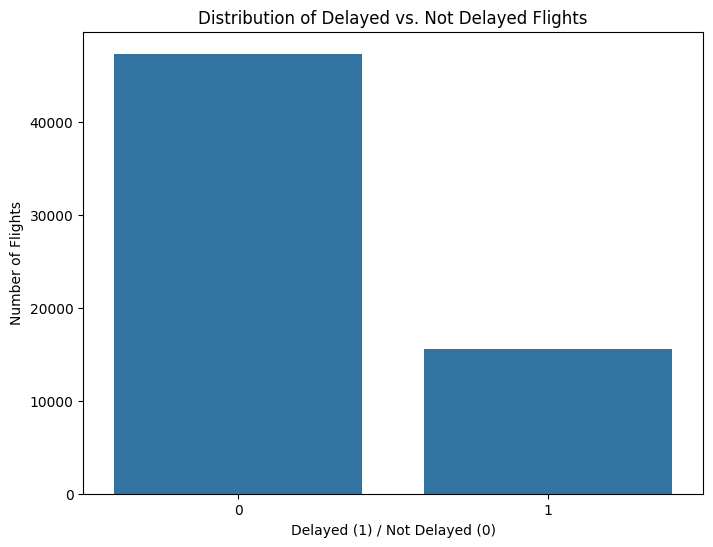

In [ ]:
plt.figure(figsize=(8,6))
sns.countplot(x='ARR_DELAY_CLASS', data=data)
plt.title('Distribution of Delayed vs. Not Delayed Flights')
plt.xlabel('Delayed (1) / Not Delayed (0)')
plt.ylabel('Number of Flights')
plt.show()

### Features (X) and target (y) variable

In [ ]:
X = data.drop(columns=['ARR_DELAY_NEW', 'ARR_DELAY_CLASS'])
y = data['ARR_DELAY_CLASS']

### Feature Importance using Information Gain

                  Feature  Information Gain
5            CRS_DEP_TIME          0.026147
6            CRS_ARR_TIME          0.023899
2      MKT_CARRIER_FL_NUM          0.017094
3       ORIGIN_AIRPORT_ID          0.010540
4         DEST_AIRPORT_ID          0.006635
10  MKT_UNIQUE_CARRIER_DL          0.006174
0            DAY_OF_MONTH          0.003216
11  MKT_UNIQUE_CARRIER_F9          0.003179
15  MKT_UNIQUE_CARRIER_UA          0.002873
7   MKT_UNIQUE_CARRIER_AA          0.002566
16  MKT_UNIQUE_CARRIER_WN          0.002475
13  MKT_UNIQUE_CARRIER_HA          0.002454
12  MKT_UNIQUE_CARRIER_G4          0.001891
14  MKT_UNIQUE_CARRIER_NK          0.001818
1             DAY_OF_WEEK          0.001070
9   MKT_UNIQUE_CARRIER_B6          0.000019
8   MKT_UNIQUE_CARRIER_AS          0.000000


Text(0, 0.5, 'Information Gain')

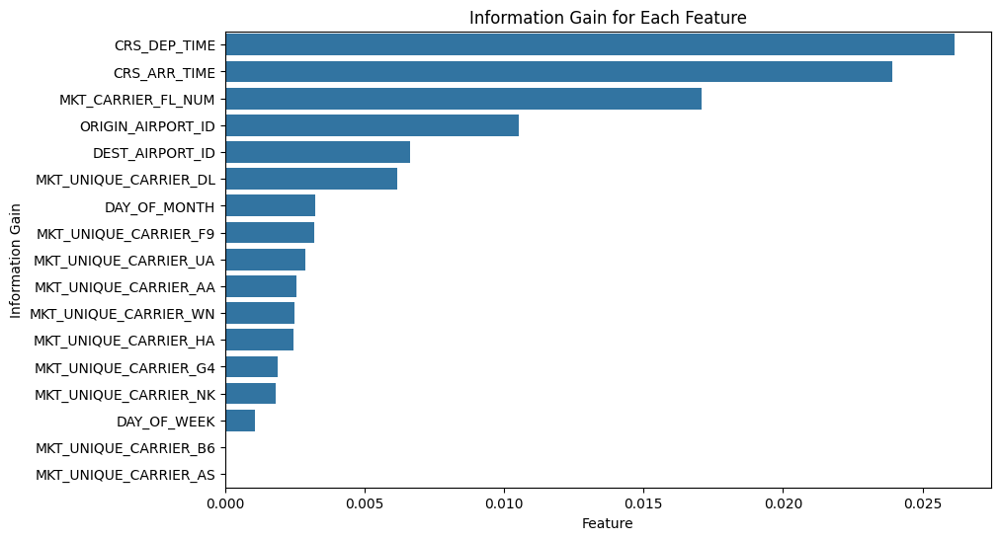

In [ ]:
# Calculating the Information Gain for each feature
information_gain = mutual_info_classif(X, y, discrete_features='auto')

# Creating a DataFrame to view the results
info_gain_df = pd.DataFrame({'Feature': X.columns, 'Information Gain': information_gain})

# Sorting the features by Information Gain
info_gain_df = info_gain_df.sort_values(by='Information Gain', ascending=False)

print(info_gain_df)

# plotting the results
plt.figure(figsize=(10,6))
sns.barplot(x='Information Gain', y='Feature', data=info_gain_df)
plt.title('Information Gain for Each Feature')
plt.xlabel('Feature')
plt.ylabel('Information Gain')

## Model Training

## K-Fold Cross Vallidation

In [ ]:
# Initializing KFold with 5 splits
kf = KFold(n_splits=5, shuffle=True, random_state=42)

### Decision Tree Classifier

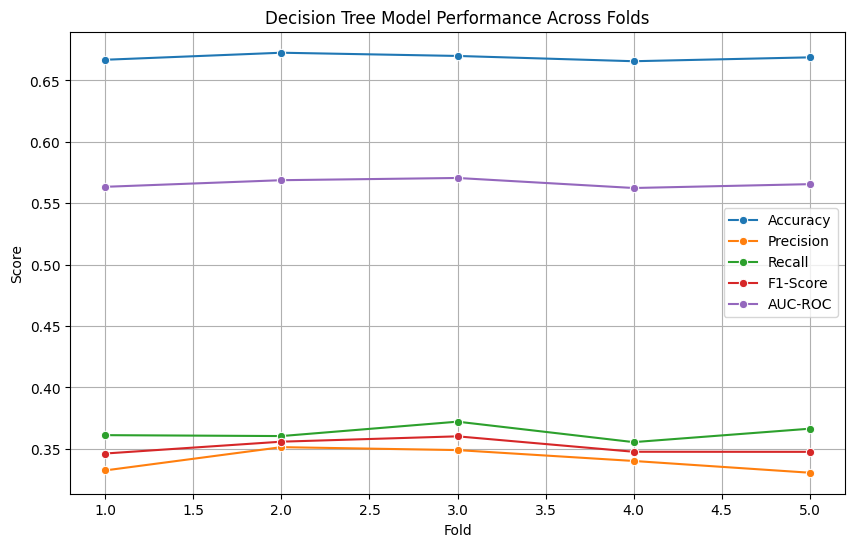

Mean Accuracy: 0.6687999497339966
Mean Precision: 0.3406926868068266
Mean Recall: 0.3631098847187288
Mean F1-Score: 0.3514783777004699
Mean AUC-ROC: 0.5661599847670324


In [ ]:
# Initializing the Decision Tree classifier
dt_model = DecisionTreeClassifier(random_state=42)

# Defining scoring metrics
scoring = {
    'accuracy': 'accuracy',
    'precision': 'precision',
    'recall': 'recall',
    'f1': 'f1',
    'roc_auc': 'roc_auc'
}

# cross-validation
cv_results = cross_validate(dt_model, X, y, cv=kf, scoring=scoring)

# Extracting the metrics
accuracy = cv_results['test_accuracy']
precision = cv_results['test_precision']
recall = cv_results['test_recall']
f1 = cv_results['test_f1']
roc_auc = cv_results['test_roc_auc']

# Creating a DataFrame to hold the results
metrics_df = pd.DataFrame({
    'Fold': np.arange(1, kf.get_n_splits(X) + 1),
    'Accuracy': accuracy,
    'Precision': precision,
    'Recall': recall,
    'F1-Score': f1,
    'AUC-ROC': roc_auc
})

# Plotting the results
plt.figure(figsize=(10, 6))
sns.lineplot(data=metrics_df, x='Fold', y='Accuracy', marker='o', label='Accuracy')
sns.lineplot(data=metrics_df, x='Fold', y='Precision', marker='o', label='Precision')
sns.lineplot(data=metrics_df, x='Fold', y='Recall', marker='o', label='Recall')
sns.lineplot(data=metrics_df, x='Fold', y='F1-Score', marker='o', label='F1-Score')
sns.lineplot(data=metrics_df, x='Fold', y='AUC-ROC', marker='o', label='AUC-ROC')

plt.title('Decision Tree Model Performance Across Folds')
plt.xlabel('Fold')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.show()


print(f'Mean Accuracy: {accuracy.mean()}')
print(f'Mean Precision: {precision.mean()}')
print(f'Mean Recall: {recall.mean()}')
print(f'Mean F1-Score: {f1.mean()}')
print(f'Mean AUC-ROC: {roc_auc.mean()}')

### Logistic Regression

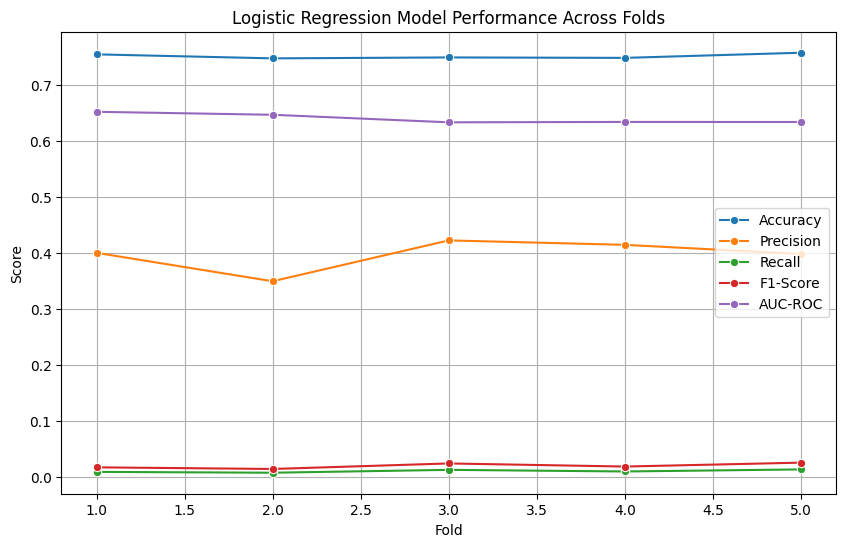

Mean Accuracy: 0.7515522993217828
Mean Precision: 0.39673469387755106
Mean Recall: 0.009936128451870436
Mean F1-Score: 0.019369909245286237
Mean AUC-ROC: 0.6399969479991363


In [ ]:
# Initializing Logistic Regression model
model = LogisticRegression(max_iter=1000)

# Defining scoring metrics
scoring = {
    'accuracy': 'accuracy',
    'precision': 'precision',
    'recall': 'recall',
    'f1': 'f1',
    'roc_auc': 'roc_auc'
}

# cross-validation
cv_results = cross_validate(model, X, y, cv=kf, scoring=scoring)

# Extracting the metrics
accuracy = cv_results['test_accuracy']
precision = cv_results['test_precision']
recall = cv_results['test_recall']
f1 = cv_results['test_f1']
roc_auc = cv_results['test_roc_auc']

# Creating a DataFrame to hold the results
metrics_df = pd.DataFrame({
    'Fold': np.arange(1, kf.get_n_splits(X) + 1),
    'Accuracy': accuracy,
    'Precision': precision,
    'Recall': recall,
    'F1-Score': f1,
    'AUC-ROC': roc_auc
})

# Plotting the results
plt.figure(figsize=(10, 6))
sns.lineplot(data=metrics_df, x='Fold', y='Accuracy', marker='o', label='Accuracy')
sns.lineplot(data=metrics_df, x='Fold', y='Precision', marker='o', label='Precision')
sns.lineplot(data=metrics_df, x='Fold', y='Recall', marker='o', label='Recall')
sns.lineplot(data=metrics_df, x='Fold', y='F1-Score', marker='o', label='F1-Score')
sns.lineplot(data=metrics_df, x='Fold', y='AUC-ROC', marker='o', label='AUC-ROC')

plt.title('Logistic Regression Model Performance Across Folds')
plt.xlabel('Fold')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.show()


print(f'Mean Accuracy: {accuracy.mean()}')
print(f'Mean Precision: {precision.mean()}')
print(f'Mean Recall: {recall.mean()}')
print(f'Mean F1-Score: {f1.mean()}')
print(f'Mean AUC-ROC: {roc_auc.mean()}')

### K-Nearest Neighbors Classifier

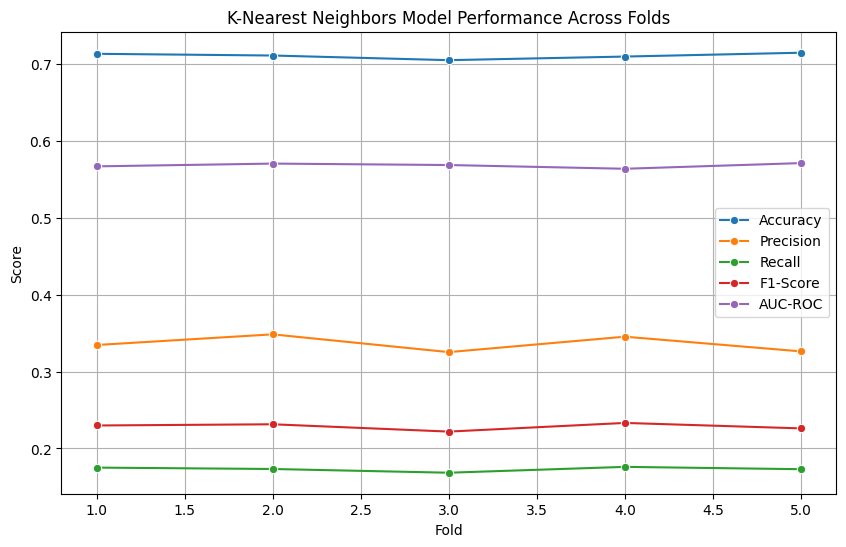

Mean Accuracy: 0.7109880591248542
Mean Precision: 0.33599784144607453
Mean Recall: 0.17311155587801444
Mean F1-Score: 0.22847212926219435
Mean AUC-ROC: 0.5683424501037905


In [ ]:
# Initializing the K-Nearest Neighbors classifier
knn_model = KNeighborsClassifier(n_neighbors=5)

# Defining scoring metrics
scoring = {
    'accuracy': 'accuracy',
    'precision': 'precision',
    'recall': 'recall',
    'f1': 'f1',
    'roc_auc': 'roc_auc'
}

# cross-validation
cv_results = cross_validate(knn_model, X, y, cv=kf, scoring=scoring)

# Extracting the metrics
accuracy = cv_results['test_accuracy']
precision = cv_results['test_precision']
recall = cv_results['test_recall']
f1 = cv_results['test_f1']
roc_auc = cv_results['test_roc_auc']

# Creating a DataFrame to hold the results
metrics_df = pd.DataFrame({
    'Fold': np.arange(1, kf.get_n_splits(X) + 1),
    'Accuracy': accuracy,
    'Precision': precision,
    'Recall': recall,
    'F1-Score': f1,
    'AUC-ROC': roc_auc
})

# Plotting the results
plt.figure(figsize=(10, 6))
sns.lineplot(data=metrics_df, x='Fold', y='Accuracy', marker='o', label='Accuracy')
sns.lineplot(data=metrics_df, x='Fold', y='Precision', marker='o', label='Precision')
sns.lineplot(data=metrics_df, x='Fold', y='Recall', marker='o', label='Recall')
sns.lineplot(data=metrics_df, x='Fold', y='F1-Score', marker='o', label='F1-Score')
sns.lineplot(data=metrics_df, x='Fold', y='AUC-ROC', marker='o', label='AUC-ROC')

plt.title('K-Nearest Neighbors Model Performance Across Folds')
plt.xlabel('Fold')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.show()


print(f'Mean Accuracy: {accuracy.mean()}')
print(f'Mean Precision: {precision.mean()}')
print(f'Mean Recall: {recall.mean()}')
print(f'Mean F1-Score: {f1.mean()}')
print(f'Mean AUC-ROC: {roc_auc.mean()}')

### Random Forest Classifier

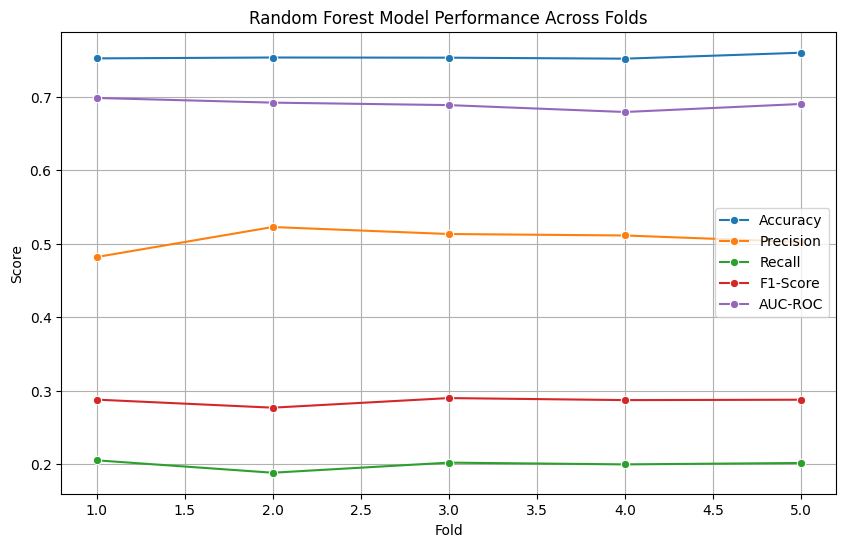

Mean Accuracy: 0.7538606968403526
Mean Precision: 0.5060203495851441
Mean Recall: 0.1991768387907157
Mean F1-Score: 0.2856767069015679
Mean AUC-ROC: 0.6894393202965654


In [ ]:
model = RandomForestClassifier(n_estimators=100, random_state=42)

# Defining scoring metrics
scoring = {
    'accuracy': 'accuracy',
    'precision': 'precision',
    'recall': 'recall',
    'f1': 'f1',
    'roc_auc': 'roc_auc'
}

# cross-validation
cv_results = cross_validate(model, X, y, cv=kf, scoring=scoring)

# Extracting the metrics
accuracy = cv_results['test_accuracy']
precision = cv_results['test_precision']
recall = cv_results['test_recall']
f1 = cv_results['test_f1']
roc_auc = cv_results['test_roc_auc']

# Creating a DataFrame to hold the results
metrics_df = pd.DataFrame({
    'Fold': np.arange(1, kf.get_n_splits(X) + 1),
    'Accuracy': accuracy,
    'Precision': precision,
    'Recall': recall,
    'F1-Score': f1,
    'AUC-ROC': roc_auc
})

# Plotting the results
plt.figure(figsize=(10, 6))
sns.lineplot(data=metrics_df, x='Fold', y='Accuracy', marker='o', label='Accuracy')
sns.lineplot(data=metrics_df, x='Fold', y='Precision', marker='o', label='Precision')
sns.lineplot(data=metrics_df, x='Fold', y='Recall', marker='o', label='Recall')
sns.lineplot(data=metrics_df, x='Fold', y='F1-Score', marker='o', label='F1-Score')
sns.lineplot(data=metrics_df, x='Fold', y='AUC-ROC', marker='o', label='AUC-ROC')

plt.title('Random Forest Model Performance Across Folds')
plt.xlabel('Fold')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.show()


print(f'Mean Accuracy: {accuracy.mean()}')
print(f'Mean Precision: {precision.mean()}')
print(f'Mean Recall: {recall.mean()}')
print(f'Mean F1-Score: {f1.mean()}')
print(f'Mean AUC-ROC: {roc_auc.mean()}')

## Using Xtrain ytrain

In [ ]:
# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Decision Tree Classifier

Accuracy: 0.6668789301918332
Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.77      0.78      9495
           1       0.33      0.36      0.35      3068

    accuracy                           0.67     12563
   macro avg       0.56      0.56      0.56     12563
weighted avg       0.68      0.67      0.67     12563

Confusion Matrix:
[[7270 2225]
 [1960 1108]]


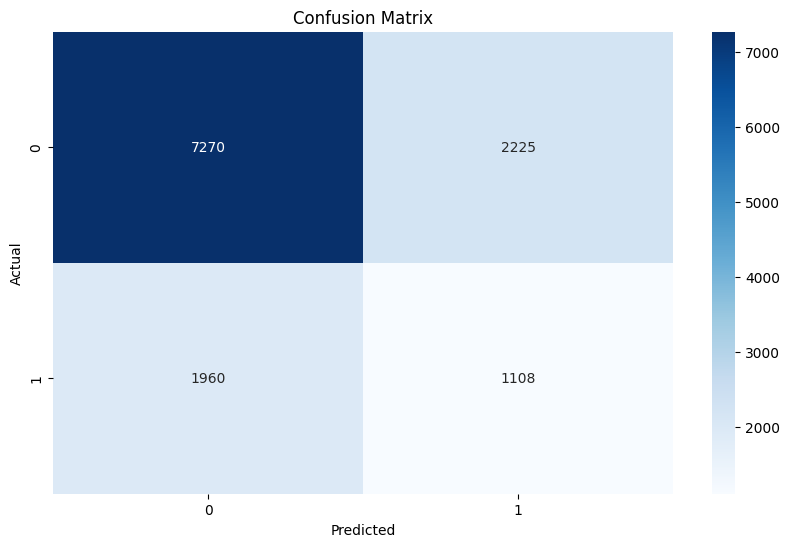

In [ ]:
dt_model = DecisionTreeClassifier(random_state=42)

# Training the model
dt_model.fit(X_train, y_train)

# Making predictions on the test set
y_pred = dt_model.predict(X_test)

# Evaluating the model
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

# plotting the results
plt.figure(figsize=(10,6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


### Logistic Regression

Accuracy: 0.7547560296107617
Classification Report:
              precision    recall  f1-score   support

           0       0.76      1.00      0.86      9495
           1       0.40      0.01      0.02      3068

    accuracy                           0.75     12563
   macro avg       0.58      0.50      0.44     12563
weighted avg       0.67      0.75      0.65     12563

Confusion Matrix:
[[9456   39]
 [3042   26]]


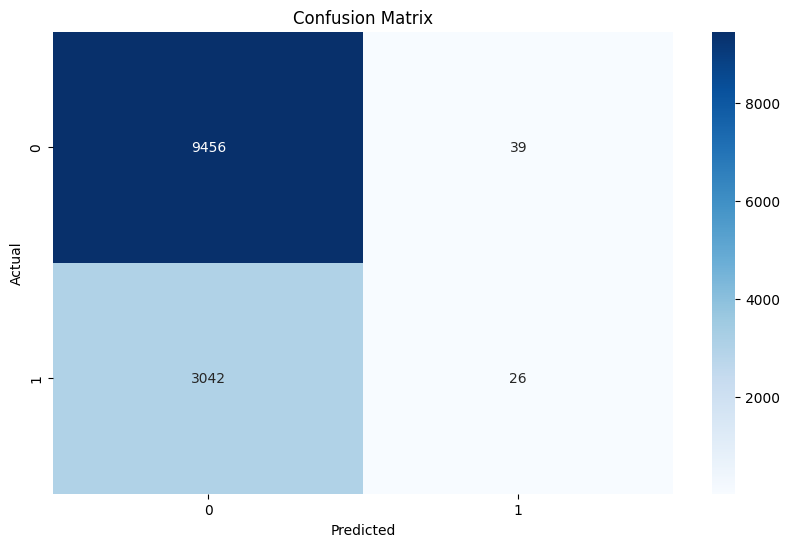

In [ ]:
model = LogisticRegression(max_iter=1000)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

# plotting the results
plt.figure(figsize=(10,6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

### K-Nearest Neighbors

Accuracy: 0.7133646422032954
Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.89      0.82      9495
           1       0.33      0.18      0.23      3068

    accuracy                           0.71     12563
   macro avg       0.55      0.53      0.53     12563
weighted avg       0.66      0.71      0.68     12563

Confusion Matrix:
[[8425 1070]
 [2531  537]]


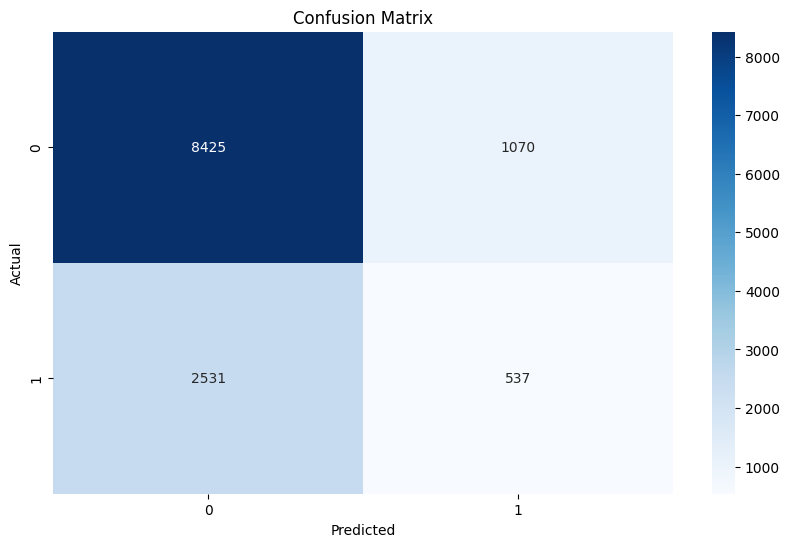

In [ ]:
knn_model = KNeighborsClassifier(n_neighbors=5)

knn_model.fit(X_train, y_train)

y_pred = knn_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

# plotting the results
plt.figure(figsize=(10,6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

### Random Forest Classifier

Accuracy: 0.7556316166520736
Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.93      0.85      9495
           1       0.50      0.21      0.30      3068

    accuracy                           0.76     12563
   macro avg       0.64      0.57      0.57     12563
weighted avg       0.72      0.76      0.72     12563

Confusion Matrix:
[[8846  649]
 [2421  647]]


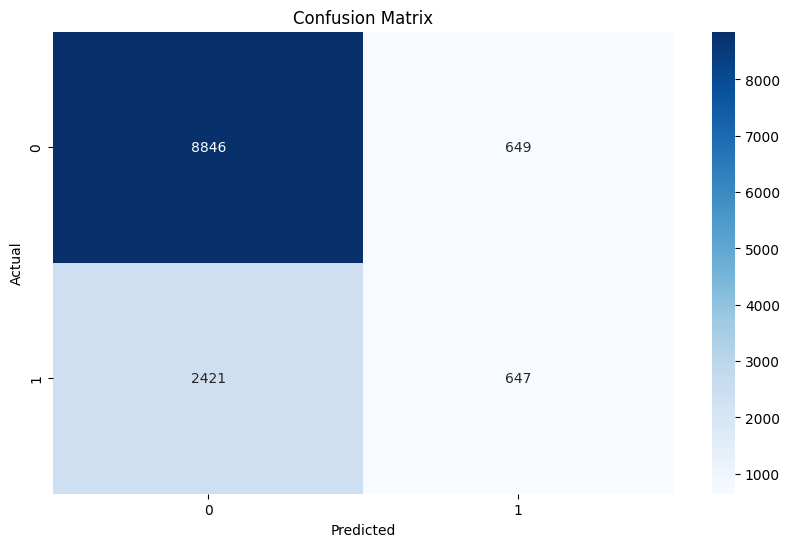

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

# plotting the results
plt.figure(figsize=(10,6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()